# SimRa-Datensatz - Datenanalyse

In diesem Notebook führen wir eine explorative Datenanalyse für den SimRa-Datensatz durch. Der von uns genutzte Datensatz enthält alle aufgezeichneten Fahrten und eingetragenen Beinaheunfälle von Mai 2019 bis April 2024 für die Region Berlin/Potsdam. 
Ziel ist es, ein Verständnis des Datensatzes zu entwickeln, diesen zu analysieren und zu bereinigen.

### Zum SimRa-Projekt

Im Projekt `SimRa` werden folgende Daten erhoben: 

    "Daten darüber, wo es in der Stadt für Radfahrende zu Gefahrenhäufungen kommt, welcher Art diese sind, ob diese zeitlich oder lokal gehäuft auftreten und wo sich die Hauptverkehrsflüsse auf dem Rad bewegen. Hierfür wurde im Projekt eine Smartphone-App entwickelt, die mittels GPS-Daten Fahrtrouten aufzeichnet und dabei Beschleunigungssensoren zum Detektieren von Gefahrensituationen nutzt – bspw. plötzliches Bremsen, Ausweichen oder gar einen Sturz. Im Anschluss an die Fahrt werden Radfahrende gebeten, diese detektierten Gefahrensituationen zu kategorisieren und zu annotieren, etwaige nicht detektierte Gefahrensituationen zu ergänzen und einen Upload auf die Projektserver frei zu geben." 
([siehe SimRa-Projekt](https://www.digital-future.berlin/forschung/projekte/simra/))
    
Der Datensatz ist öffentlich zugänglich und kann nach Rückspreche für unser Projekte genutzt werden. 

# Explorative Datenanalyse

### Datensatz im GeoJSON-Format 
#### Struktur

* FeatureCollection: Die oberste Ebene des GeoJSON-Dokuments ist eine FeatureCollection, die eine Sammlung von GeoJSON-Features enthält.

* Features: Jedes Element in der features-Liste ist ein GeoJSON-Feature, das eine spezifische geografische Entität darstellt (z.B. eine Straße oder eine Kreuzung).

* id:  dient dazu, jedes Feature eindeutig zu identifizieren. Es handelt sich um einen eindeutigen Bezeichner für jede Straße oder Kreuzung, der in der id-Eigenschaft des Features gespeichert ist. &rarr; kennzeichnet einen weiteren spezifischen Straßenabschnitt bzw. Segment

#### Eigenschaften der Features

Jedes Feature hat verschiedene Eigenschaften, die in der properties-Objektstruktur gespeichert sind:

- *type*: Beschreibt den Typ des Features, z.B. "Street" oder "Junction".
- *score*: Ein numerischer Wert, der ein "Gefärlichkeitsbewertungsscore" darstellt.
- *incidents*: Anzahl der aufgezeichneten Beinaheunfälle.
- *rides*: Anzahl der Fahrradfahrten, die auf diesem Straßenabschnitt oder an dieser Kreuzung aufgezeichnet wurden.
- *length*: Länge des Straßenabschnitts in Metern.
- *rides south west / north east*: Anzahl der Fahrten, die in die jeweilige Richtung (Südwest/Nordost) unternommen wurden.
- *incidents south west / north east*: Anzahl der Zwischenfälle in der jeweiligen Richtung (Südwest/Nordost).
- *score south west / north east*: ???
- Diese Abkürzungen stehen für verschiedene Arten von Vorfällen, die von den Fahrradfahrerenden im Falle eines Beinaheunfalls angegeben werden können:
   - *clopa* (Close Pass): Zu dichtes Überholen
   - *spiot* (Someone pulling in or out): Ein- oder ausparkendes Fahrzeug
   - *nlorh* (Near left or right hook): Beinahe-Abbiegeunfall
   - *saho* (someone approaching head on): Entgegenkommender Verkehrsteilnehmer
   - *ssho*
   - *tailgating*: Zu dichtes Auffahren
   - *nd (near-dooring)*: Beinahe-Dooring
   - *dao* (Dodging an obstacle): Einem Hindernis ausweichen (z.B. Hund)
   - *other*: Sonstiges

#### Geometrie der Features

* `geometry`: Beschreibt die Form und Lage des Features mittels eines GeoJSON-Objekts vom Typ "Polygon".

## 1. Laden Daten

In [1]:
import pandas as pd
import json
import os
import numpy as np
import matplotlib.pyplot as plt

import shapely
from shapely.geometry import shape
import geopandas as gpd

In [2]:
path_file = 'https://raw.githubusercontent.com/simra-project/simra-project.github.io/master/region/Berlin.json'

df = pd.read_json(path_file)
df.head(3)

,type,features
0,FeatureCollection,"{'type': 'Feature', 'id': '[79310].0', 'proper..."
1,FeatureCollection,"{'type': 'Feature', 'id': '[196724641, 1967255..."
2,FeatureCollection,"{'type': 'Feature', 'id': '[112051].0', 'prope..."


- Dataframe enthält eine Spalte, die `features` enthält, in der jedes Element ein Dictionary repräsentiert, das verschiedene Eigenschaften eines Features enthält

### Verarbeitung der Daten
Da die JSON-Daten verschachtelt sind, ist es sinnvoll, die features-Liste zu extrahieren und zu normalisieren:
(*Normalisieren* &rarr; die verschachtelte Struktur der JSON-Daten in eine flache tabellarische Form umwandeln, s.d.jede Ebene der Verschachtelung in eine separate Spalte des DataFrames konvertiert wird.)

In [3]:
# Extrahieren der 'features'-Liste und Umwandlung in einen DataFrame
features = df['features']
df = pd.json_normalize(features)
df.head(3)


,type,id,properties.type,properties.score,properties.incidents,properties.rides,properties.length,properties.rides south west,properties.incidents south west,properties.score south west,...,properties.saho,properties.tailgating,properties.nd,properties.dao,properties.other,properties.markers,geometry.type,geometry.coordinates,properties.ssho,properties.near-dooring
0,Feature,[79310].0,Street,0.000000,0,57,20.129336,57.0,0.0,0.0,...,0.0,0,0.0,0,0,[],Polygon,"[[[13.374104370195251, 52.53030806146536], [13...",NaN,NaN
1,Feature,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,NaN,NaN,NaN,NaN,...,NaN,0,NaN,0,0,"[[[13.41786066, 52.51446901], Datum: 14/05/202...",Polygon,"[[[13.417507500073658, 52.514606342445354], [1...",0.0,0.0
2,Feature,[112051].0,Street,0.000000,0,190,18.022919,190.0,0.0,0.0,...,0.0,0,0.0,0,0,[],Polygon,"[[[13.509141286628028, 52.45236419221383], [13...",NaN,NaN


### Auffälligkeiten
- Je nachdem, ob es sich um den Typ "Street" oder "Junction" handelt, werden unterschiedliche Bezeichnungen verwendet: "nd" anstatt "near-dooring"; "saho" anstatt "ssh"
- bei "Junction fehlen die Angaben zu: "length", "rides south west", "incidents south west", "score south west", "rides north east", "incidents north east", "score north east";
&rarr; Beduetung siehe oben

> Da wir diese Spalten für unsere Fragestellung nicht nutzen, betrachten wir sie nur im Zusammenhang mit Duplikaten und der Analyse der Daten. Für die weitere Verarbeitung und im Rahmen der datenbereinigung werden wir die Spalten entfernen. 

## 2. Grundlegende Informationen
* Der Datensatz enthält `16465 Einträge`. Ein Eintrag entspricht einem Polygon, mit der dazugehöriger `Anzahl an Fahrten durch das Polyogon`, `Anzahl an Beinaheunfällen`, ggf. das Datum sowie die Art und teilweise einer Erklärung zu den Beinaheunfällen.
* Es wird der Typ angegeben: `Street`oder `Junction`

In [4]:
df.shape

(16820, 26)

In [5]:
df.describe()

,properties.score,properties.incidents,properties.rides,properties.length,properties.rides south west,properties.incidents south west,properties.score south west,properties.rides north east,properties.incidents north east,properties.score north east,properties.clopa,properties.spiot,properties.nlorh,properties.saho,properties.tailgating,properties.nd,properties.dao,properties.other,properties.ssho,properties.near-dooring
count,16820.000000,16820.000000,16820.000000,11363.000000,11363.000000,11363.000000,11363.000000,11363.0,11363.0,11363.0,16820.000000,16820.000000,16820.000000,11363.00000,16820.000000,11363.000000,16820.000000,16820.000000,5457.000000,5457.000000
mean,0.011403,1.217658,222.813199,51.259761,185.858488,1.206812,0.013694,0.0,0.0,-1.0,0.623960,0.042687,0.089596,0.06354,0.097325,0.009329,0.206837,0.083234,0.068536,0.007880
std,0.048811,5.891543,266.115431,50.811567,193.711179,6.446099,0.057247,0.0,0.0,0.0,4.643575,0.270137,0.644025,0.47856,0.682207,0.105729,1.335093,0.638810,0.403968,0.090475
min,0.000000,0.000000,10.000000,0.185823,10.000000,0.000000,0.000000,0.0,0.0,-1.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,76.000000,15.508250,73.000000,0.000000,0.000000,0.0,0.0,-1.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,125.000000,37.090588,115.000000,0.000000,0.000000,0.0,0.0,-1.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.005587,1.000000,253.000000,70.090041,216.000000,1.000000,0.005882,0.0,0.0,-1.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.522222,332.000000,4011.000000,842.306425,1981.000000,332.000000,1.522222,0.0,0.0,-1.0,305.000000,10.000000,38.000000,29.00000,22.000000,3.000000,77.000000,62.000000,15.000000,2.000000


## 2. Datenbereinigung
### Fehlende Werte

In [6]:
missing_values = df.isnull().sum()
print("Fehlende Werte pro Spalte:")
print(missing_values)

Fehlende Werte pro Spalte:
type                                   0
id                                     0
properties.type                        0
properties.score                       0
properties.incidents                   0
properties.rides                       0
properties.length                   5457
properties.rides south west         5457
properties.incidents south west     5457
properties.score south west         5457
properties.rides north east         5457
properties.incidents north east     5457
properties.score north east         5457
properties.clopa                       0
properties.spiot                       0
properties.nlorh                       0
properties.saho                     5457
properties.tailgating                  0
properties.nd                       5457
properties.dao                         0
properties.other                       0
properties.markers                     0
geometry.type                          0
geometry.coordinates          

#### Umgang mit fehlenden Werten: 
- Die fehlenden Werte sind für das weitere Vorgehen irrelevant.
- Alle Merkmale, bei denen es fehlende Werte gibt, können wir für unser Modell verbachlässigen und für das weitere Vorgehen aus unserem Datensatz entfernen (siehe weiter unten, Punkt 6."Entfernen nicht benötigter Merkmale des Datensatzes").


### Duplikate

*Die Methode duplicated() funktioniert nicht richtig mit nicht-hashbaren Typen (z.B. Listen, dictionaries).* 
- Listen in Python sind nicht hashbar.

#### Nicht hashbare Spalten identifizieren

In [7]:
# Funktion zur Überprüfung, ob eine Spalte hashbare Werte enthält
def is_column_hashable(column):
    return column.apply(lambda x: isinstance(x, (int, float, str, tuple, bool, type(None)))).all()

# Finden und anzeigen der Spalten, die nicht-hashbare Werte enthalten
non_hashable_columns = [col for col in df.columns if not is_column_hashable(df[col])]
print("Spalten mit nicht-hashbaren Werten:")
print(non_hashable_columns)


Spalten mit nicht-hashbaren Werten:
['properties.markers', 'geometry.coordinates']


#### Eine Option: Nicht-hashbare Listen in Tupel konvertieren

In [8]:
# Funktion wandelt Listen rekursiv in Tupel um
def convert_to_tuple(value):
    if isinstance(value, list):
        return tuple(convert_to_tuple(v) for v in value)
    return value

# Anwenden der convert_to_tuple-Funktion auf den gesamten DataFrame:
# .map() wendet die Funktion auf jede Zelle im DataFrame an
df = df.map(convert_to_tuple)
df.head(2)

,type,id,properties.type,properties.score,properties.incidents,properties.rides,properties.length,properties.rides south west,properties.incidents south west,properties.score south west,...,properties.saho,properties.tailgating,properties.nd,properties.dao,properties.other,properties.markers,geometry.type,geometry.coordinates,properties.ssho,properties.near-dooring
0,Feature,[79310].0,Street,0.000000,0,57,20.129336,57.0,0.0,0.0,...,0.0,0,0.0,0,0,(),Polygon,"(((13.374104370195251, 52.53030806146536), (13...",NaN,NaN
1,Feature,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,NaN,NaN,NaN,NaN,...,NaN,0,NaN,0,0,"(((13.41786066, 52.51446901), Datum: 14/05/202...",Polygon,"(((13.417507500073658, 52.514606342445354), (1...",0.0,0.0


In [9]:
# Finden von Duplikaten
duplicates = df.duplicated()

# Anzahl der Duplikate
num_duplicates = duplicates.sum()
print(f'Anzahl der Duplikate: {num_duplicates}')

Anzahl der Duplikate: 0


Es sind keine Duplikate vorhanden. 

## 4.  Zusammenfassende Statistik und Visualisierungen
### Profilbericht

In [20]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")

profile.to_notebook_iframe()

#### Bemerkung zu `Alerts`:
- Die hier angegeben Duplikate ergeben sich vsl. aus dadurch, dass `properties:markers` und `geometry.coordinates` als `unsupported type`behandelt werden. (siehe Punkt "Duplikate")
- `Missing values`, `highly skewed`, `zeros`, `highly imbalanced`, `highly overall correlated` &rarr; kann vernachlässigt werden, da: 
    - ergibt sich teilweise aus den Daten, da es für manche Merkmale nur die Variable 0 oder 1 gibt
    - die Art der Unfalle hängt stark mit der Variable "incidents" zusammen
    - einige Merkmale gibt es nur bei Typ `Street`und andere nur bei Typ `Junction`, daher kommen die fehlenden Werte
  

### Überprüfen der Zeitangabe der Daten

In [21]:
df.head(2)

,type,id,properties.type,properties.score,properties.incidents,properties.rides,properties.length,properties.rides south west,properties.incidents south west,properties.score south west,...,properties.saho,properties.tailgating,properties.nd,properties.dao,properties.other,properties.markers,geometry.type,geometry.coordinates,properties.ssho,properties.near-dooring
0,Feature,[79310].0,Street,0.000000,0,57,20.129336,57.0,0.0,0.0,...,0.0,0,0.0,0,0,(),Polygon,"(((13.374104370195251, 52.53030806146536), (13...",NaN,NaN
1,Feature,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,NaN,NaN,NaN,NaN,...,NaN,0,NaN,0,0,"(((13.41786066, 52.51446901), Datum: 14/05/202...",Polygon,"(((13.417507500073658, 52.514606342445354), (1...",0.0,0.0


In [22]:
df['properties.markers'].head()

0                                                   ()
1    (((13.41786066, 52.51446901), Datum: 14/05/202...
2                                                   ()
3    (((13.28022209, 52.43354718), Datum: 05/05/202...
4    (((12.981830779463053, 52.403151439502835), Da...
Name: properties.markers, dtype: object

In [23]:
import re

def extract_date(text):
    # Ermitteln des Datumsformats
    pattern = r'Datum:\s*(\d{2}/\d{2}/\d{4})'
    match = re.search(pattern, text)
    
    if match:
        return match.group(1)  # Rückgabe des gefundenen Datums
    else:
        return None  # Rückgabe von None, wenn kein Datum gefunden wird
        
# Anwenden der Funktion auf die gesamte Spalte und Sammeln der Datumsangaben in einer Liste
dates = df['properties.markers'].apply(lambda x: extract_date(str(x)) if pd.notnull(x) else None).dropna()

In [24]:
# Konvertieren der Datumsangaben in das Datetime-Format von pandas
dates = pd.to_datetime(dates, format='%d/%m/%Y')

In [25]:
# minimales und maximales Datum

min_date = dates.min()
max_date = dates.max()

print(f"Minimales Datum: {min_date}")
print(f"Maximales Datum: {max_date}")

Minimales Datum: 2003-01-16 00:00:00
Maximales Datum: 2024-06-24 00:00:00


In [26]:
# Funktion zur Extraktion der Jahreszahl
def extract_year(text):
    # Musters zum Erkennen der Jahreszahl
    pattern = r'Datum:\s*\d{2}/\d{2}/(\d{4})'
    match = re.search(pattern, text)
    
    if match:
        return match.group(1)  # Rückgabe der gefundenen Jahreszahl
    else:
        return None  # Rückgabe von None, wenn keine Jahreszahl gefunden wird

In [27]:
# Anwenden der Funktion auf die gesamte Spalte und Sammeln der Jahresangaben in einer Liste
years = df['properties.markers'].apply(lambda x: extract_year(str(x)) if pd.notnull(x) else None)
years.head(3)

0    None
1    2023
2    None
Name: properties.markers, dtype: object

In [28]:
# Entfernen von None-Werten und Zählen der Häufigkeit jeder Jahreszahl
year_counts = years.dropna().value_counts()

print(year_counts)

properties.markers
2019    1536
2020    1067
2024     818
2021     758
2023     621
2022     588
2003       1
Name: count, dtype: int64


### Anmerkungen: 
- Es gibt einen Eintrage mit dem Datum 2003. Das mus ein Fehler sein, da die Daten erst ab 2019 erhoben wurden. 
- Im Folgenden vernachlässigen wir diesen einen Fehleintrag, da es nur ein Entrag ist und für unser Projekt irrelevant ist, um welches genaue Datum es sich handelt. 

## 5. Entfernen nicht benötigter Merkmale des Datensatzes


#### Relevante Merkmale
- Die Variable `Score`: Der **Gefahrenscore** beschreibt den Anteil an Gefahrensituationen bezogen auf die Gesamtzahl an Fahrten im jeweilgen Segment wobei Gefahrensituationen, die als *beängstigend* (scary) markiert wurden, mit dem Faktor 4,4 gewichtet werden.
- Die Variable `Incidents`: Anzahl der Beinaheunfälle pro Segment/Polygon
- Die Variable `Rides`: Gesamtanzahl der Fahrten pro Segment
- Die Variable `Type`: Art des Segments (Junction oder Street)
- `geometry.coordinates`: Polygone 

In [29]:
df.columns

Index(['type', 'id', 'properties.type', 'properties.score',
       'properties.incidents', 'properties.rides', 'properties.length',
       'properties.rides south west', 'properties.incidents south west',
       'properties.score south west', 'properties.rides north east',
       'properties.incidents north east', 'properties.score north east',
       'properties.clopa', 'properties.spiot', 'properties.nlorh',
       'properties.saho', 'properties.tailgating', 'properties.nd',
       'properties.dao', 'properties.other', 'properties.markers',
       'geometry.type', 'geometry.coordinates', 'properties.ssho',
       'properties.near-dooring'],
      dtype='object')

In [30]:
# Liste der Spalten / Merkmale, die beibehalten werden sollen
columns_to_keep = ['type', 'id', 'properties.type', 'properties.score', 'properties.incidents', 'properties.rides', 
                   'geometry.type', 'geometry.coordinates']

df = df[columns_to_keep]
df.head(2)

,type,id,properties.type,properties.score,properties.incidents,properties.rides,geometry.type,geometry.coordinates
0,Feature,[79310].0,Street,0.000000,0,57,Polygon,"(((13.374104370195251, 52.53030806146536), (13..."
1,Feature,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,Polygon,"(((13.417507500073658, 52.514606342445354), (1..."


## 6. Speichern des DataFrame als CSV

In [31]:
#file_path = os.path.join('../../data/processed_data', 'simra_cleaned.csv')

In [32]:
#df.to_csv(file_path, index=False)

## 7. Konvertieren in ein GeoDataFrame & Räumliche Analyse

In [50]:
import geopandas as gpd

path_file = 'https://raw.githubusercontent.com/simra-project/simra-project.github.io/master/region/Berlin.json'

gdf = gpd.read_file(path_file)

In [51]:
gdf.head(3)

,id,type,score,incidents,rides,length,rides south west,incidents south west,score south west,rides north east,...,nlorh,saho,ssho,tailgating,nd,near-dooring,dao,other,markers,geometry
0,[79310].0,Street,0.000000,0,57,20.129336,57.0,0.0,0.0,0.0,...,0,0.0,NaN,0,0.0,NaN,0,0,[ ],"POLYGON ((13.3741 52.53031, 13.37421 52.5302, ..."
1,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,NaN,NaN,NaN,NaN,NaN,...,0,NaN,0.0,0,NaN,0.0,0,0,"[ [ [ 13.417860660000001, 52.514469009999999 ]...","POLYGON ((13.41751 52.51461, 13.41779 52.51442..."
2,[112051].0,Street,0.000000,0,190,18.022919,190.0,0.0,0.0,0.0,...,0,0.0,NaN,0,0.0,NaN,0,0,[ ],"POLYGON ((13.50914 52.45236, 13.50899 52.45249..."


In [52]:
gdf.shape

(16820, 24)

### Nur relevante Merkmale behalten

In [53]:
# Liste der Spalten / Merkmale, die beibehalten werden sollen
columns_to_keep = ['id', 'type', 'score', 'incidents', 'rides', 'geometry']
gdf = gdf[columns_to_keep]

gdf.head(3)

,id,type,score,incidents,rides,geometry
0,[79310].0,Street,0.000000,0,57,"POLYGON ((13.3741 52.53031, 13.37421 52.5302, ..."
1,"[196724641, 196725586, 866264912].0",Junction,0.000649,1,1541,"POLYGON ((13.41751 52.51461, 13.41779 52.51442..."
2,[112051].0,Street,0.000000,0,190,"POLYGON ((13.50914 52.45236, 13.50899 52.45249..."


In [54]:
gdf['geometry'].head(3)

0    POLYGON ((13.3741 52.53031, 13.37421 52.5302, ...
1    POLYGON ((13.41751 52.51461, 13.41779 52.51442...
2    POLYGON ((13.50914 52.45236, 13.50899 52.45249...
Name: geometry, dtype: geometry

<Axes: >

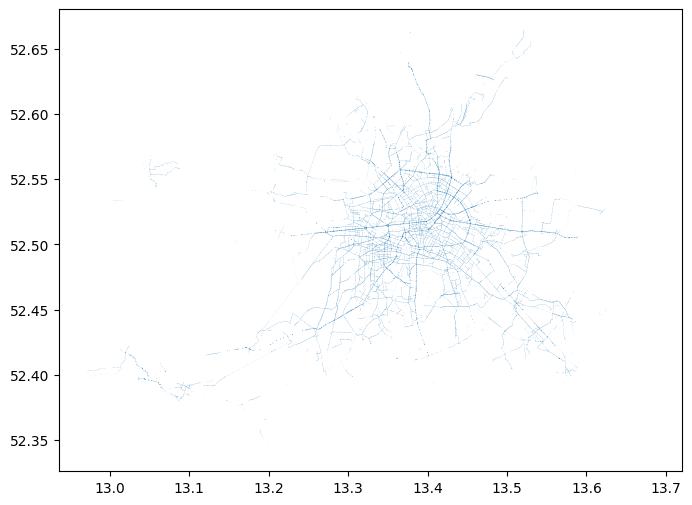

In [55]:
fig, ax = plt.subplots(figsize=(12, 6))  
gdf.plot(ax=ax)

In [56]:
gdf.explore()

In [57]:
gdf.geometry.head(3)

0    POLYGON ((13.3741 52.53031, 13.37421 52.5302, ...
1    POLYGON ((13.41751 52.51461, 13.41779 52.51442...
2    POLYGON ((13.50914 52.45236, 13.50899 52.45249...
Name: geometry, dtype: geometry

In [58]:
type(gdf.geometry)

geopandas.geoseries.GeoSeries

In [59]:
print(gdf.geometry[0])

POLYGON ((13.374104370195251 52.53030806146536, 13.37421017024184 52.53019993969052, 13.37428762775672 52.530263794034745, 13.373987662204911 52.53057016606221, 13.373910249486086 52.53050626624914, 13.374104370195251 52.53030806146536))


In [60]:
type(gdf.geometry[0])

shapely.geometry.polygon.Polygon

#### Koordinatenreferenzsystem (CRS)
- `gdf.crs`gibt das Koordinatenreferenzsystem (CRS) des GeoDataFrames (gdf) zurück. 
-  Das CRS definiert, wie die geometrischen Daten in deinem GeoDataFrame auf der Erdoberfläche dargestellt werden. 

In [61]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

- `EPSG:4326` ist ein Koordinatensystem, das auf dem WGS 84 (World Geodetic System 1984) basiert. Dieses Koordinatensystem verwendet Längengrad und Breitengrad als geographische Koordinaten und ist das am weitesten verbreitete Koordinatensystem für GPS-Koordinaten. 

## Räumliche Analyse
### Entfernen der Segmente außerhalb Berlins

In [62]:
# Umriss Berlin (Polygon im .geojson-Format)
path_file = '../../data/raw_data/Berlin_boundary.geojson'

gdf_berlin = gpd.read_file(path_file)

print(gdf_berlin)

                                            geometry
0  POLYGON ((13.08834 52.41963, 13.09584 52.42197...


#### Überprüfen ob beide geoDataFrames dasselbe Koordinatenreferenzsystem haben

In [63]:
print("CRS von Berlin:", gdf_berlin.crs)

CRS von Berlin: EPSG:4326


In [64]:
# Sicherstellen, dass beide GeoDataFrames dasselbe Koordinatenreferenzsystem verwenden
# if gdf.crs != gdf_berlin.crs:
#    gdf = gdf.tocrs(gdf_berlin.crs)

### Identifizieren der Polygone, die außerhalb von Berlin liegen

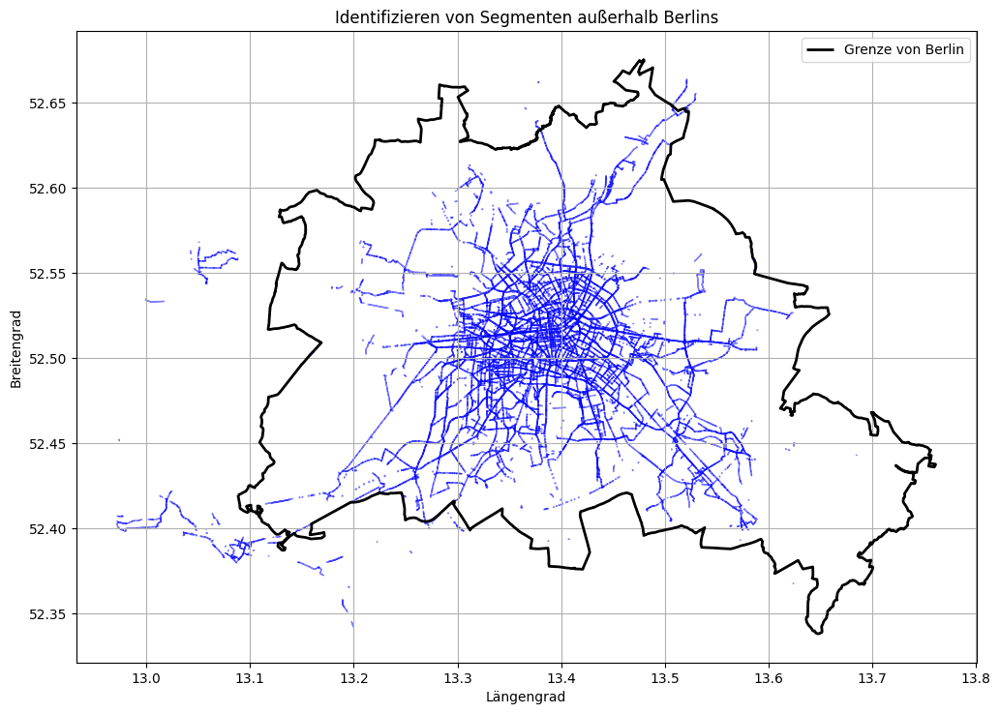

In [65]:
plt.figure(figsize=(12, 10))

# Plot des GeoDataFrames für Berlin 
gdf_berlin.boundary.plot(ax=plt.gca(), edgecolor='black', linewidth=2, label='Grenze von Berlin')

# Plot der Polygone aus dem SimRa-Datensatz
gdf.plot(ax=plt.gca(), facecolor='lightblue', edgecolor='blue', alpha=0.5)

plt.title('Identifizieren von Segmenten außerhalb Berlins')
plt.xlabel('Längengrad')
plt.ylabel('Breitengrad')
plt.legend()
plt.grid(True)
plt.show()


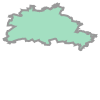

In [66]:
berlinpolygon = gdf_berlin.geometry.iloc[0]
berlinpolygon

### Entfernen der Polygone, die außerhalb von Berlin liegen

In [67]:
berlin_boundary = gpd.read_file('../../data/raw_data/Berlin_boundary.geojson')

In [68]:
berlin_polygon = berlin_boundary.geometry.iloc[0]

In [69]:
# Filtern der Polygone, um nur jene innerhalb Berlins zu behalten
gdf_within_berlin = gdf[gdf.geometry.within(berlin_polygon)]


In [70]:
print(f"Anzahl der Polygone innerhalb Berlins: {len(gdf_within_berlin)}")
print(f"Anzahl der Polygone außerhalb Berlins: {16819 - len(gdf_within_berlin)}")

gdf_within_berlin.shape

Anzahl der Polygone innerhalb Berlins: 16294
Anzahl der Polygone außerhalb Berlins: 525


(16294, 6)

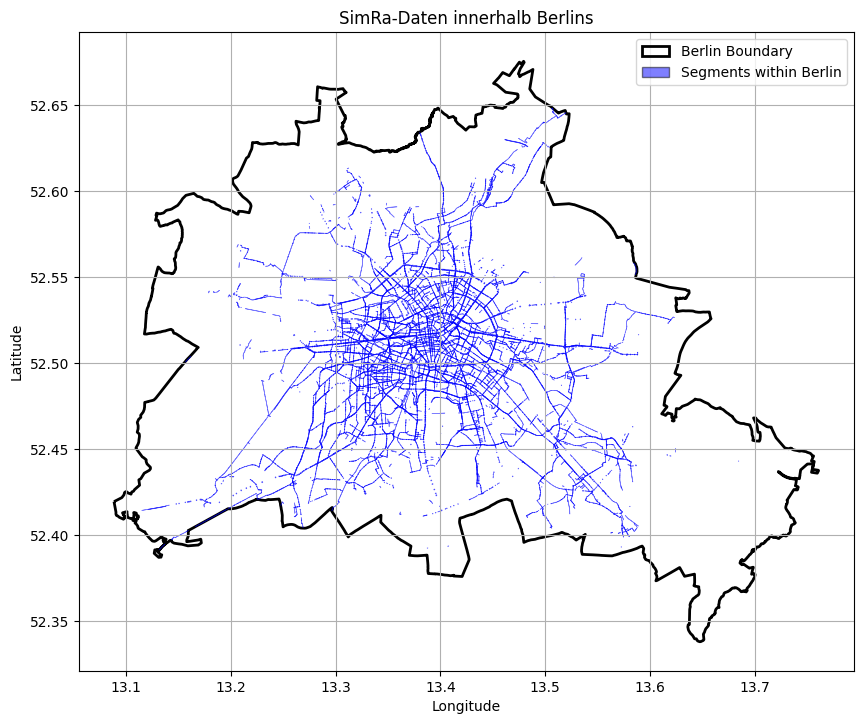

In [71]:
from matplotlib.patches import Patch  # Füge diesen Import hinzu

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# Plotten der Berlin-Grenze
berlin_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=2)

# Plotten der gefilterten Polygone innerhalb Berlins
gdf_within_berlin.plot(ax=ax, facecolor='blue', edgecolor='blue', alpha=0.5, linewidth=0.5)

plt.title('SimRa-Daten innerhalb Berlins')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)

# Erstellen einer benutzerdefinierten Legende
legend_elements = [
    Patch(facecolor='none', edgecolor='black', linewidth=2, label='Berlin Boundary'),
    Patch(facecolor='blue', edgecolor='black', alpha=0.5, label='Segments within Berlin')
]
ax.legend(handles=legend_elements, loc='upper right')


## Visualisierung: Gefahrenpunkte/Segmente mit Score > 0,25

count    16294.000000
mean         0.010328
std          0.042888
min          0.000000
25%          0.000000
50%          0.000000
75%          0.005525
max          1.522222
Name: score, dtype: float64


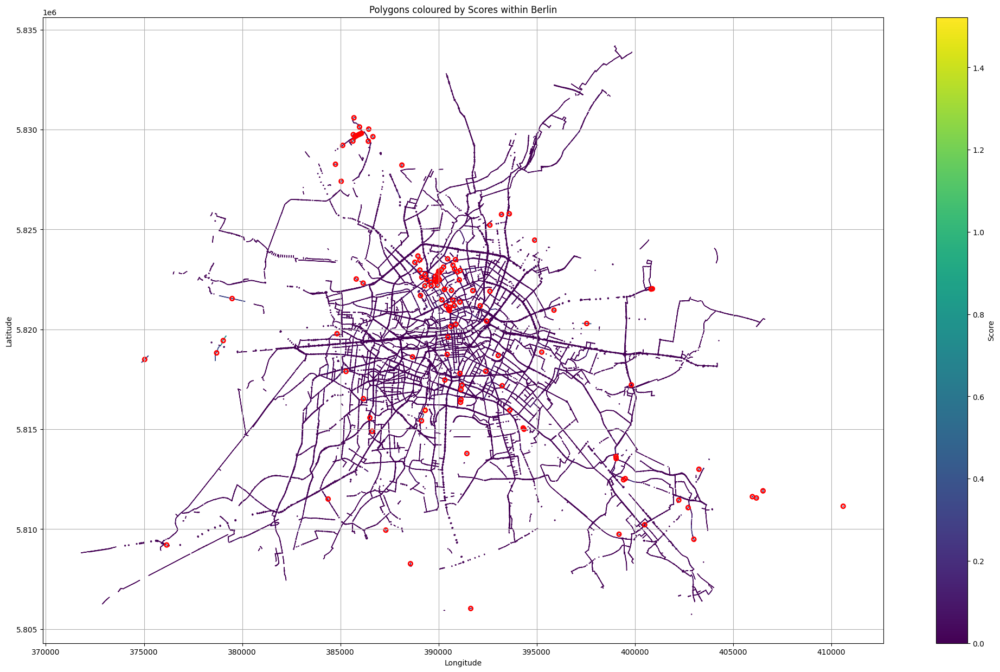

In [60]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from shapely.geometry import Point

# Stellen Sie sicher, dass die Score-Spalte korrekt extrahiert wird
if 'properties' in gdf_within_berlin.columns:
    gdf_within_berlin['score'] = gdf_within_berlin['properties'].apply(lambda x: x.get('score', float('nan')))

# Überprüfen, ob die 'score'-Spalte vorhanden ist und ob sie numerische Daten enthält
assert 'score' in gdf_within_berlin.columns, "No 'score' column found in the GeoDataFrame."
print(gdf_within_berlin['score'].describe())

# Laden der Berlin-Grenze und Prüfen des CRS
berlin_polygon = berlin_boundary.geometry.iloc[0]  # Wir nehmen an, dass das Berlin-Polygon in der ersten Zeile ist

# Sicherstellen, dass beide GeoDataFrames dasselbe Koordinatenreferenzsystem (CRS) verwenden
if gdf_within_berlin.crs != berlin_boundary.crs:
    gdf_within_berlin = gdf_within_berlin.to_crs(berlin_boundary.crs)

# Optional: Umprojizieren des GeoDataFrames in ein projiziertes CRS, falls notwendig, z.B. EPSG:32633
projected_gdf = gdf_within_berlin.to_crs(epsg=32633)

# Normieren der Scores für die Farbgebung
norm = mcolors.Normalize(vmin=projected_gdf['score'].min(), vmax=projected_gdf['score'].max())
cmap = plt.colormaps['viridis']  # Aktualisierte Methode für Matplotlib

# Plotten der Polygone mit expliziten Farben
fig, ax = plt.subplots(1, 1, figsize=(25, 15))
projected_gdf.apply(lambda x: plt.fill(*x.geometry.exterior.xy, color=cmap(norm(x['score']))), axis=1)

# Hervorheben von Segmenten mit einem Score über 0.25
highlight_threshold = 0.25
highlight_gdf = projected_gdf[projected_gdf['score'] > highlight_threshold]

for idx, geom in highlight_gdf.iterrows():
    # Berechne den Mittelpunkt des Polygons
    centroid = geom.geometry.centroid
    # Zeichne einen Kreis um den Mittelpunkt
    circle = plt.Circle((centroid.x, centroid.y), 100, color='red', fill=False, linewidth=2)  # 100 ist der Radius in Metern
    ax.add_patch(circle)

# Ergänzende Plot-Details
plt.title("Polygons coloured by Scores within Berlin")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)

# Hinzufügen einer Farblegende
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Score")

plt.show()

## Relevante Merkmale - statistische Zusammenfassung

### Die Variable `Score`

In [61]:
print(gdf_within_berlin['score'].describe())

count    16294.000000
mean         0.010328
std          0.042888
min          0.000000
25%          0.000000
50%          0.000000
75%          0.005525
max          1.522222
Name: score, dtype: float64


### Die Variable `Rides` (Anzahl der Fahrten pro Segment)

In [62]:
print(gdf_within_berlin['rides'].describe())

count    16294.000000
mean       226.295814
std        269.115164
min         10.000000
25%         77.000000
50%        128.000000
75%        257.000000
max       4011.000000
Name: rides, dtype: float64


### Die Variable `Incidents`(Anzahl der Beinaheunfälle pro Segment)

In [63]:
print(gdf_within_berlin['incidents'].describe())

count    16294.000000
mean         1.181601
std          5.737703
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max        332.000000
Name: incidents, dtype: float64


### Die Variable `Type` (Art des Segments)

In [64]:
print(gdf_within_berlin['type'].describe())

count      16294
unique         2
top       Street
freq       11040
Name: type, dtype: object


In [65]:
# Anzahl der "Junctions" 
true_count = (gdf_within_berlin['type'] == 'Junction').sum()

print("Anzahl 'Junction':", true_count)

Anzahl 'Junction': 5254


## 7. Speichern des bereinigten GeoDataFrame

In [66]:
path_file = '../../data/processed_data'

output_file_path = os.path.join(path_file, 'simra_within_berlin.geojson')
# gdf_within_berlin.to_file(output_file_path, driver='GeoJSON')

print(f"Erfolgreich in {output_file_path} gespeichert.")

Erfolgreich in ../../data/processed_data\simra_within_berlin.geojson gespeichert.


In [3]:
import geopandas as gpd

path_file = '../../data/processed_data/simra_within_berlin.geojson'

gdf = gpd.read_file(path_file)

#### Boxplot `incidents`

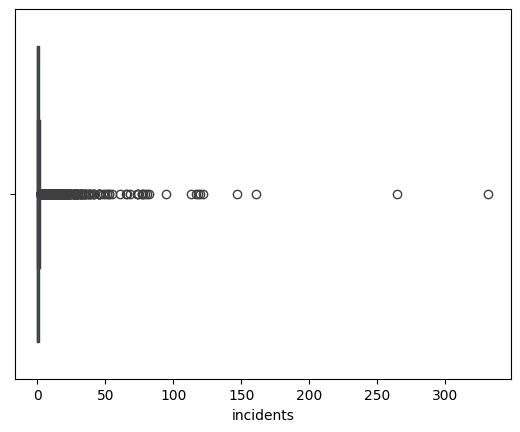

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot zur Erkennung von Ausreißern
sns.boxplot(x=gdf['incidents'])
plt.show()

#### Beziehung zwischen `incidents`und `rides`

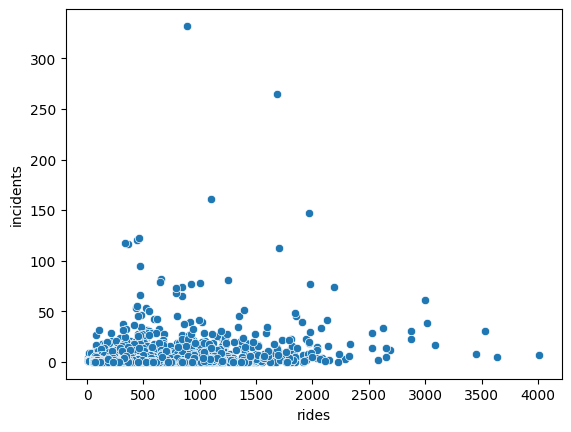

In [18]:
# Streudiagramm zur Untersuchung der Beziehung zwischen zwei numerischen Variablen
sns.scatterplot(x='rides', y='incidents', data=gdf)
plt.show()

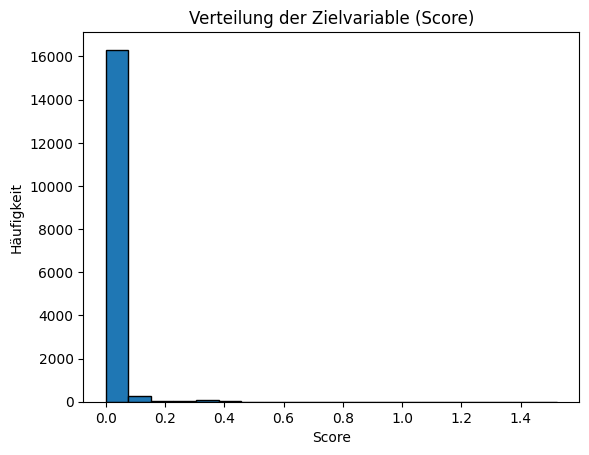

In [73]:
import matplotlib.pyplot as plt

# Verteilung der Zielvariable (score)
plt.hist(gdf['score'], bins=20, edgecolor='black')
plt.title('Verteilung der Zielvariable (Score)')
plt.xlabel('Score')
plt.ylabel('Häufigkeit')
plt.show()

In [76]:
# Höchsten und niedrigsten Wert der Zielvariable ermitteln
höchster_wert = gdf['score'].max()
niedrigster_wert = gdf['score'].min()

# Ausgabe der Werte
print(f"Höchster score-Wert: {höchster_wert}")
print(f"Niedrigster score-Wert: {niedrigster_wert}")

Höchster score-Wert: 1.5222222222222224
Niedrigster score-Wert: 0.0


### Anmerkungen und Ergebnisse: 
- Segmente außerhalb Berlins wurden entfernt. 
- Der Datensatz wurde auf Duplikate und fehlende Werte untersucht.
- Der Datensatz wurde bereinigt.

### Auffälligkeiten
- Die Verteilung der Zielvariable ist stark unausgewogen. Dies hat vsl. Auswirkungen auf das weitere Vorgehen (Modelltraining).

### Nächste Schritte: 
- Verknüpfen des SimRa-Datensatzes mit den OSM-Daten
 